In [1]:
# Deployment: streamlit 

# Encoder-decoder le texte: unidecode.unidecode(« text »)

# topic modelling

# Latent Dirichlet Allocation ou LDA
import regex as re

from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, roc_curve,roc_auc_score,ConfusionMatrixDisplay
from sklearn.svm import SVC

from sklearn.pipeline import make_pipeline
from sklearn.model_selection import GridSearchCV

In [2]:
df = pd.read_csv('df.csv',index_col = 0)

In [3]:
index_label_0 = df[df['label'] == 0].sample(frac = 0.45).index.tolist()
index_label_1 = df[df['label'] == 1].index.tolist()

In [4]:
len(index_label_0 + index_label_1)

138723

In [5]:
df = df.loc[index_label_0 + index_label_1]

df.index = range(len(df))

In [6]:
df.label.value_counts()

0    69954
1    68769
Name: label, dtype: int64

Preprocessing

In [7]:
df

,text,label,db,token_text,clean_text
0,", I mean the format of the tables, the singles...",0,db3,"['mean', 'format', 'table', 'single', 'video',...",mean format table single video official swift ...
1,New plant in Ethiopia in 2007 is launched by c...,0,db3,"['new', 'plant', 'ethiopia', 'launch', 'cadila...",new plant ethiopia launch cadila pharmaceutica...
2,"Just wikiholism, I guess. I am back to normal ...",0,db3,"['wikiholism', 'guess', 'normal']",wikiholism guess normal
3,"I didn't tag it, but I agree with the tag. The...",0,db3,"['tag', 'agree', 'tag', 'article', 'unbalanced...",tag agree tag article unbalanced paragraph wri...
4,"""\n\n The secret of life \n\n""""The secret of l...",0,db3,"['secret', 'life', 'secret', 'life', 'task', '...",secret life secret life task devote entire lif...
...,...,...,...,...,...
138718,I have not been or ever will be a sockpuppet. ...,1,db3,"['sockpuppet', 'rudeness']",sockpuppet rudeness
138719,Wiki Admin Suck \n\nYou fucking bitch shut the...,1,db3,"['wiki', 'admin', 'suck', 'fucking', 'bitch', ...",wiki admin suck fucking bitch shut fuck ass ho...
138720,"Also, I must say that I get banned for small s...",1,db3,"['ban', 'small', 'simple', 'edit', 'russians',...",ban small simple edit russians edit bullshit p...
138721,"""\n\n Wikipedia is a bias organization. I prov...",1,db3,"['wikipedia', 'bias', 'organization', 'provide...",wikipedia bias organization provide source cha...


In [8]:
df = df[df.isnull().sum(axis = 1)==False]

In [9]:
df = df[['clean_text','label','db']]
df.head()

,clean_text,label,db
0,mean format table single video official swift ...,0,db3
1,new plant ethiopia launch cadila pharmaceutica...,0,db3
2,wikiholism guess normal,0,db3
3,tag agree tag article unbalanced paragraph wri...,0,db3
4,secret life secret life task devote entire lif...,0,db3


tf-idf

In [11]:
tfidf = TfidfVectorizer()

In [13]:
X = tfidf.fit_transform(df['clean_text'])

#X = tfidf.transform(df['clean_text'])

y = np.array(df['label'])

In [14]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, stratify = y)

In [15]:
LR = LogisticRegression()

In [16]:
LR.fit(X_train,y_train)

C:\Users\matthieu.marechal\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [17]:
y_train_pred = LR.predict(X_train)
y_test_pred = LR.predict(X_test)

In [18]:
print('accuracy on train set :',accuracy_score(y_train,y_train_pred))
print('accuracy on test set :',accuracy_score(y_test,y_test_pred))

accuracy on train set : 0.944678720659311
accuracy on test set : 0.9335393680318872


In [19]:
print('f1_score on train set :',f1_score(y_train,y_train_pred))
print('f1_score on test set :',f1_score(y_test,y_test_pred))

f1_score on train set : 0.9428895161610942
f1_score on test set : 0.9312457047240565


In [20]:
f1_score(y_test,np.ones(y_test.shape))

0.6633206571048009

In [21]:
# Visualize ROC curves
import plotly.graph_objects as go

probas_train = LR.predict_proba(X_train)
fper, tper, thresholds = roc_curve(y_train, probas_train[:,1])
fig = go.Figure(
    data = go.Scatter(
        name = 'train',
        x = fper, 
        y = tper, 
        mode = 'lines'
    ),
    layout = go.Layout(
        title = go.layout.Title(text = "ROC curve", x = 0.5),
        xaxis = go.layout.XAxis(title = 'False Positive Rate'),
        yaxis = go.layout.YAxis(title = 'True Positive Rate')
    )
)

probas_test = LR.predict_proba(X_test)
fper, tper, thresholds = roc_curve(y_test, probas_test[:,1])
fig.add_trace(
 go.Scatter(
        name = 'test',
        x = fper, 
        y = tper, 
        mode = 'lines'
    )
)

fig.show()

In [22]:
print('roc_auc_score on train set:', roc_auc_score(y_train, probas_train[:,1]))
print('roc_auc_score on test set:', roc_auc_score(y_test, probas_test[:,1]))

roc_auc_score on train set: 0.9876957766562131
roc_auc_score on test set: 0.9808198624638931


Grid Search: Logistic Regression

In [23]:
LR.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [24]:
LR_param_grid = {'C' : [2**k for k in range(-7,8)] , 'solver' : ["newton-cg","lbfgs","liblinear"]}

gsLR = GridSearchCV(estimator = LR , param_grid = LR_param_grid , scoring='accuracy',
                     cv=2,
                     refit=True,
                     n_jobs=1,error_score='raise')

In [25]:
gsLR.fit(X_train,y_train)

C:\Users\matthieu.marechal\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\matthieu.marechal\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

C:\Users\matthieu.

GridSearchCV(cv=2, error_score='raise', estimator=LogisticRegression(),
             n_jobs=1,
             param_grid={'C': [0.0078125, 0.015625, 0.03125, 0.0625, 0.125,
                               0.25, 0.5, 1, 2, 4, 8, 16, 32, 64, 128],
                         'solver': ['newton-cg', 'lbfgs', 'liblinear']},
             scoring='accuracy')

In [26]:
gsLR.best_score_

0.9276664163441357

In [27]:
gsLR.best_params_

{'C': 4, 'solver': 'lbfgs'}

In [28]:
clfLR = gsLR.best_estimator_

In [29]:
y_train_pred = clfLR.predict(X_train)
y_test_pred = clfLR.predict(X_test)

In [30]:
print('accuracy on train set :',accuracy_score(y_train,y_train_pred))
print('accuracy on test set :',accuracy_score(y_test,y_test_pred))

accuracy on train set : 0.964598617449406
accuracy on test set : 0.9364277049275027


In [31]:
print('f1_score on train set :',f1_score(y_train,y_train_pred))
print('f1_score on test set :',f1_score(y_test,y_test_pred))

f1_score on train set : 0.9639357768471023
f1_score on test set : 0.9345661028034604


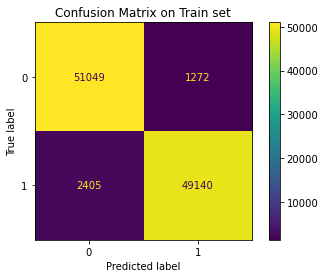

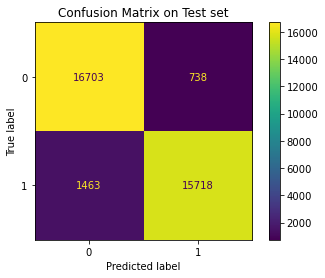

In [32]:
import matplotlib.pyplot as plt
# Visualize confusion matrices
_ , ax = plt.subplots() # Get subplot from matplotlib
ax.set(title="Confusion Matrix on Train set") # Set a title that we will add into ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(clfLR, X_train, y_train, ax=ax) # ConfusionMatrixDisplay from sklearn
plt.show()

_ , ax = plt.subplots() # Get subplot from matplotlib
ax.set(title="Confusion Matrix on Test set") # Set a title that we will add into ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(clfLR, X_test, y_test, ax=ax) # ConfusionMatrixDisplay from sklearn
plt.show()

In [33]:
# Visualize ROC curves
import plotly.graph_objects as go

probas_train = clfLR.predict_proba(X_train)
fper, tper, thresholds = roc_curve(y_train, probas_train[:,1])
fig = go.Figure(
    data = go.Scatter(
        name = 'train',
        x = fper, 
        y = tper, 
        mode = 'lines'
    ),
    layout = go.Layout(
        title = go.layout.Title(text = "ROC curve", x = 0.5),
        xaxis = go.layout.XAxis(title = 'False Positive Rate'),
        yaxis = go.layout.YAxis(title = 'True Positive Rate')
    )
)

probas_test = clfLR.predict_proba(X_test)
fper, tper, thresholds = roc_curve(y_test, probas_test[:,1])
fig.add_trace(
 go.Scatter(
        name = 'test',
        x = fper, 
        y = tper, 
        mode = 'lines'
    )
)

In [34]:
print('roc_auc_score on train set:', roc_auc_score(y_train, probas_train[:,1]))
print('roc_auc_score on test set:', roc_auc_score(y_test, probas_test[:,1]))

roc_auc_score on train set: 0.9935027675039481
roc_auc_score on test set: 0.9818978029984808


In [35]:
import pickle

with open('LR.pkl','wb') as lr:
    pickle.dump(clfLR,lr)    

In [36]:
with open('TFIDF.pkl','wb') as TFIDF:
    pickle.dump(tfidf,TFIDF)

Random Forest

In [37]:
pipelineRFC = make_pipeline(RandomForestClassifier(criterion='gini', random_state=1))
#
# Create the parameter grid
#
param_grid_rfc = [{
    'randomforestclassifier__max_depth':[10, 20, 30]
}]
#
# Create an instance of GridSearch Cross-validation estimator
#
gsRFC = GridSearchCV(estimator=pipelineRFC,
                     param_grid = param_grid_rfc,
                     scoring='accuracy',
                     cv=2,
                     refit=True,
                     n_jobs=1,error_score='raise')
#
# Train the RandomForestClassifier
#
gsRFC = gsRFC.fit(X_train, y_train)
#
# Print the training score of the best model
#
print(gsRFC.best_score_)
#
# Print the model parameters of the best model
#
print(gsRFC.best_params_)
#
# Print the test score of the best model
#
clfRFC = gsRFC.best_estimator_
print('Test accuracy: %.3f' % clfRFC.score(X_test, y_test))

0.8542641480368937
{'randomforestclassifier__max_depth': 30}
Test accuracy: 0.845


In [38]:
y_train_pred = clfRFC.predict(X_train)
y_test_pred = clfRFC.predict(X_test)

In [39]:
print('accuracy on train set :',accuracy_score(y_train,y_train_pred))
print('accuracy on test set :',accuracy_score(y_test,y_test_pred))

accuracy on train set : 0.8546300040436716
accuracy on test set : 0.845185142395009


In [40]:
print('f1_score on train set :',f1_score(y_train,y_train_pred))
print('f1_score on test set :',f1_score(y_test,y_test_pred))

f1_score on train set : 0.8649741108716453
f1_score on test set : 0.8555489678219156


In [41]:
# Visualize ROC curves
import plotly.graph_objects as go

probas_train = clfRFC.predict_proba(X_train)
fper, tper, thresholds = roc_curve(y_train, probas_train[:,1])
fig = go.Figure(
    data = go.Scatter(
        name = 'train',
        x = fper, 
        y = tper, 
        mode = 'lines'
    ),
    layout = go.Layout(
        title = go.layout.Title(text = "ROC curve", x = 0.5),
        xaxis = go.layout.XAxis(title = 'False Positive Rate'),
        yaxis = go.layout.YAxis(title = 'True Positive Rate')
    )
)

probas_test = clfRFC.predict_proba(X_test)
fper, tper, thresholds = roc_curve(y_test, probas_test[:,1])
fig.add_trace(
 go.Scatter(
        name = 'test',
        x = fper, 
        y = tper, 
        mode = 'lines'
    )
)

In [42]:
print('roc_auc_score on train set:', roc_auc_score(y_train, probas_train[:,1]))
print('roc_auc_score on test set:', roc_auc_score(y_test, probas_test[:,1]))

roc_auc_score on train set: 0.9591350610490871
roc_auc_score on test set: 0.9448993660588096


XGBoost

In [43]:
from xgboost import XGBClassifier

In [44]:
xgboost = XGBClassifier(objective= 'binary:logistic')

In [45]:
param_grid_xgboost =  {'max_depth': range (2, 10, 1),
    'n_estimators': range(60, 220, 40),
    'learning_rate': [0.1, 0.01, 0.05]}

In [46]:
gs_xgboost = GridSearchCV(estimator=xgboost,
                     param_grid = param_grid_xgboost,
                     scoring='accuracy',
                     cv=2,
                     refit=True,
                     n_jobs=1,error_score='raise')

In [47]:
gs_xgboost.fit(X_train,y_train)

GridSearchCV(cv=2, error_score='raise',
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     gamma=None, gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=None, reg_alpha=None,
                                     reg_lambda=None, ...),
             n_jobs=1,
             param_grid={'learning_rate': [0.1, 0.01, 0.05],
                         'max_depth': range(2, 10),
                         'n_estimators': range(60, 220, 40)},
             scoring='accuracy')

In [48]:
clf_xgboost = gs_xgboost.best_estimator_

In [49]:
gs_xgboost.best_params_

{'learning_rate': 0.1, 'max_depth': 9, 'n_estimators': 180}

In [50]:
y_train_pred = clf_xgboost.predict(X_train)
y_test_pred = clf_xgboost.predict(X_test)

In [51]:
print('accuracy on train set :',accuracy_score(y_train,y_train_pred))
print('accuracy on test set :',accuracy_score(y_test,y_test_pred))

accuracy on train set : 0.9340015019351857
accuracy on test set : 0.9239500895384438


In [52]:
print('f1_score on train set :',f1_score(y_train,y_train_pred))
print('f1_score on test set :',f1_score(y_test,y_test_pred))

f1_score on train set : 0.9299473711103162
f1_score on test set : 0.9194825846304394


In [53]:
# Visualize ROC curves
import plotly.graph_objects as go

probas_train = clf_xgboost.predict_proba(X_train)
fper, tper, thresholds = roc_curve(y_train, probas_train[:,1])
fig = go.Figure(
    data = go.Scatter(
        name = 'train',
        x = fper, 
        y = tper, 
        mode = 'lines'
    ),
    layout = go.Layout(
        title = go.layout.Title(text = "ROC curve", x = 0.5),
        xaxis = go.layout.XAxis(title = 'False Positive Rate'),
        yaxis = go.layout.YAxis(title = 'True Positive Rate')
    )
)

probas_test = clf_xgboost.predict_proba(X_test)
fper, tper, thresholds = roc_curve(y_test, probas_test[:,1])
fig.add_trace(
 go.Scatter(
        name = 'test',
        x = fper, 
        y = tper, 
        mode = 'lines'
    )
)

In [54]:
print('roc_auc_score on train set:', roc_auc_score(y_train, probas_train[:,1]))
print('roc_auc_score on test set:', roc_auc_score(y_test, probas_test[:,1]))

roc_auc_score on train set: 0.9811887283946671
roc_auc_score on test set: 0.9740006202023368


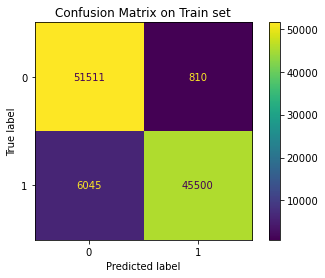

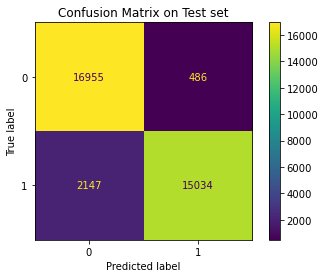

In [55]:
import matplotlib.pyplot as plt
# Visualize confusion matrices
_ , ax = plt.subplots() # Get subplot from matplotlib
ax.set(title="Confusion Matrix on Train set") # Set a title that we will add into ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(clf_xgboost, X_train, y_train, ax=ax) # ConfusionMatrixDisplay from sklearn
plt.show()

_ , ax = plt.subplots() # Get subplot from matplotlib
ax.set(title="Confusion Matrix on Test set") # Set a title that we will add into ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_estimator(clf_xgboost, X_test, y_test, ax=ax) # ConfusionMatrixDisplay from sklearn
plt.show()

In [56]:
with open('xgboost.pkl','wb') as XGBOOST:
    pickle.dump(clf_xgboost,XGBOOST)